<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Initialization" data-toc-modified-id="Initialization-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Initialization</a></span><ul class="toc-item"><li><span><a href="#Libraries-and-functions" data-toc-modified-id="Libraries-and-functions-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Libraries and functions</a></span></li><li><span><a href="#Settings" data-toc-modified-id="Settings-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Settings</a></span></li><li><span><a href="#Directories-and-folders" data-toc-modified-id="Directories-and-folders-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Directories and folders</a></span></li></ul></li><li><span><a href="#Data" data-toc-modified-id="Data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Data</a></span><ul class="toc-item"><li><span><a href="#Remove-data-points-with-NA-in-bioclimatic-variables" data-toc-modified-id="Remove-data-points-with-NA-in-bioclimatic-variables-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Remove data points with NA in bioclimatic variables</a></span></li><li><span><a href="#Extract-the-land-cover-fractions-under-analysis" data-toc-modified-id="Extract-the-land-cover-fractions-under-analysis-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Extract the land cover fractions under analysis</a></span></li></ul></li><li><span><a href="#Empirical-distribution" data-toc-modified-id="Empirical-distribution-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Empirical distribution</a></span><ul class="toc-item"><li><span><a href="#Fractions" data-toc-modified-id="Fractions-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Fractions</a></span></li><li><span><a href="#Positive-fractions" data-toc-modified-id="Positive-fractions-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Positive fractions</a></span></li></ul></li><li><span><a href="#Transformations" data-toc-modified-id="Transformations-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Transformations</a></span><ul class="toc-item"><li><span><a href="#Log-transformed-fractions" data-toc-modified-id="Log-transformed-fractions-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Log-transformed fractions</a></span></li><li><span><a href="#Box&amp;Cox-transformed-fractions" data-toc-modified-id="Box&amp;Cox-transformed-fractions-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Box&amp;Cox-transformed fractions</a></span></li></ul></li><li><span><a href="#Correlation-with-features" data-toc-modified-id="Correlation-with-features-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Correlation with features</a></span><ul class="toc-item"><li><span><a href="#Spearman-correlation-coefficient" data-toc-modified-id="Spearman-correlation-coefficient-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Spearman correlation coefficient</a></span></li><li><span><a href="#Pearson-correlation-coefficient" data-toc-modified-id="Pearson-correlation-coefficient-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Pearson correlation coefficient</a></span></li></ul></li><li><span><a href="#Pairwise-relationships" data-toc-modified-id="Pairwise-relationships-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Pairwise relationships</a></span><ul class="toc-item"><li><span><a href="#No-transformation-of-target-variable" data-toc-modified-id="No-transformation-of-target-variable-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>No transformation of target variable</a></span><ul class="toc-item"><li><span><a href="#Scatterplots" data-toc-modified-id="Scatterplots-6.1.1"><span class="toc-item-num">6.1.1&nbsp;&nbsp;</span>Scatterplots</a></span></li><li><span><a href="#Log-rescaled-2D-Histograms" data-toc-modified-id="Log-rescaled-2D-Histograms-6.1.2"><span class="toc-item-num">6.1.2&nbsp;&nbsp;</span>Log-rescaled 2D Histograms</a></span></li></ul></li></ul></li></ul></div>

# Initialization

## Libraries and functions

In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt

from scipy.stats import boxcox
from matplotlib.colors import TwoSlopeNorm, Normalize, LogNorm
from matplotlib.cm import ScalarMappable
from mpl_toolkits.axes_grid1 import make_axes_locatable
from IPython.display import display, Markdown, HTML

from MyFunctions import * 
from MyConstants import *

## Settings

In [2]:
# Jupyter notebook appearance
%matplotlib inline
sns.set(context = 'notebook', style = "darkgrid", color_codes=False)
#display(HTML("<style>.container { width:90% !important; }</style>"))

In [3]:
# Choose the data to use
year = '2018'  # Year
res = '09'  # Resolution of data hexagones
lc_id = '12'  # Land cover id
lc = 'Croplands'  # Land cover name

In [4]:
# Choose whether to save or not the plots
save_plot = False
# Saved Plots' Parameters
SPP = {'dpi': 200, 'format': 'jpg', 'bbox_inches': 'tight'}

In [5]:
# Choose epsilon for variable transformation
eps = 1e-5

## Directories and folders

In [6]:
# Data directories
data_dir = f'Ecosphere/ISEA3H{res}'
# Plot directory
plot_dir = f'Output/{lc_id}. {lc}/Plots/Analysis plots/'

In [7]:
# Create directories
os.makedirs(plot_dir, exist_ok=True)

# Data

Import data from all and only the hexagons such that:
- at least 1 bioclimatic variable is available;
- they are not only composed of water bodies.

In [8]:
data = ImportData(year, res, data_dir, land=True, stats=True)
display(data.head())

The dataset is composed of 196832 hexagons, of which:<br>- 63918 correspond to lands (32.47%);<br>- 132914 correspond to water bodies (67.53%);<br>- 56821 have at least one bioclimate variable available (28.87%);<br>- 140011 have no bioclimate variable available (71.13%);<br>- Reducing to the land hexagons:<br>-- 56695 hexagons have at least one bioclimate variable available (88.7%).

,HID,geometry,IGBP_01_Fraction,IGBP_02_Fraction,IGBP_03_Fraction,IGBP_04_Fraction,IGBP_05_Fraction,IGBP_06_Fraction,IGBP_07_Fraction,IGBP_08_Fraction,...,BIO10_Centroid,BIO11_Centroid,BIO12_Centroid,BIO13_Centroid,BIO14_Centroid,BIO15_Centroid,BIO16_Centroid,BIO17_Centroid,BIO18_Centroid,BIO19_Centroid
55,56,POINT (11.25000 79.18998),0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.900000,-14.300000,417.0,49.0,18.0,28.678305,130.0,64.0,85.0,119.0
74,75,POINT (11.25000 64.32417),0.152131,0.0,0.0,0.000083,0.023048,0.000000,0.036395,0.374067,...,13.450000,-1.933333,1314.0,150.0,62.0,28.921973,425.0,215.0,258.0,402.0
75,76,POINT (11.25000 63.56055),0.179920,0.0,0.0,0.000828,0.043075,0.000000,0.144881,0.153827,...,12.766667,-3.883333,1221.0,138.0,70.0,21.339184,379.0,222.0,320.0,317.0
76,77,POINT (11.25000 62.79923),0.039768,0.0,0.0,0.000414,0.011350,0.000083,0.491301,0.035294,...,9.883333,-7.500000,779.0,96.0,43.0,25.895052,264.0,138.0,257.0,172.0
77,78,POINT (11.25000 62.04027),0.051254,0.0,0.0,0.000083,0.001159,0.000000,0.043388,0.070299,...,9.683333,-9.533333,697.0,92.0,32.0,35.856390,257.0,103.0,257.0,119.0


## Remove data points with NA in bioclimatic variables

In [9]:
data.replace(to_replace=-100, value=np.nan, inplace=True)
data.dropna(axis='index', how='any', inplace=True)

display(Markdown(f"The dataset is composed of {data.shape[0]} data points."))

The dataset is composed of 56683 data points.

## Extract the land cover fractions under analysis

In [10]:
LC = data[['geometry', f'IGBP_{lc_id}_Fraction']].copy()
LC.columns = ['geometry', lc]

# Empirical distribution

## Fractions

The sample unbiased skewness of the distribution is 3.039

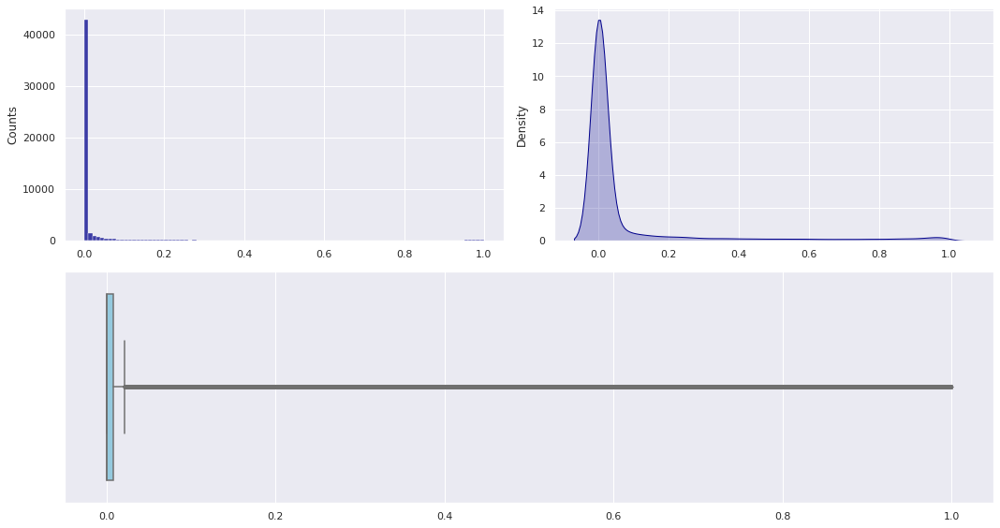

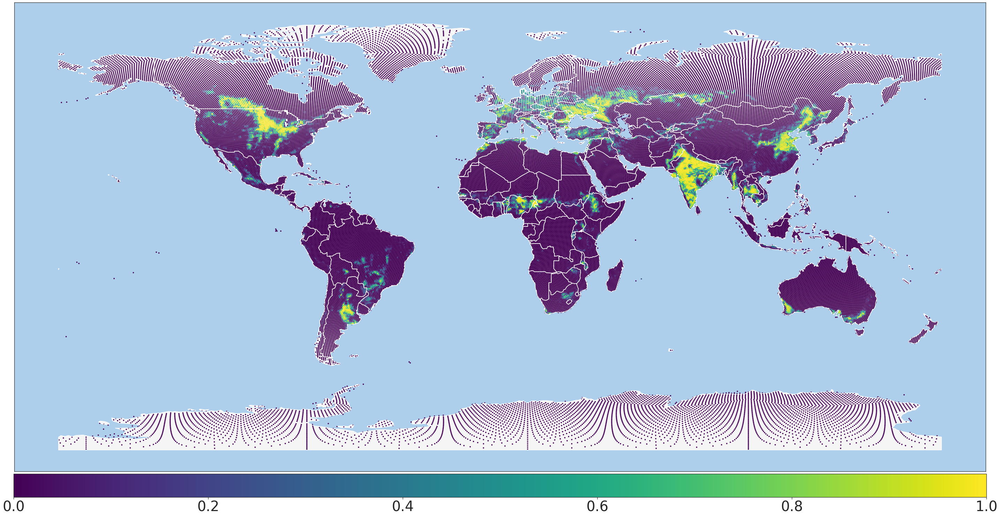

In [11]:
display(Markdown("The sample unbiased skewness of the distribution is "
                 f"{LC[lc].skew():.4}"))

name = f"IGBP{lc_id}_EmpiricalDistribution"
EmpiricalDistribution(LC[lc], save=save_plot, plot_dir=plot_dir, title=name,
                      save_params=SPP)

GeoPlot(LC, lc, save=save_plot, plot_dir=plot_dir, title=f'IGBP{lc_id}_Map',
       save_params=SPP)

## Positive fractions

The sample unbiased skewness of the distribution is 1.426

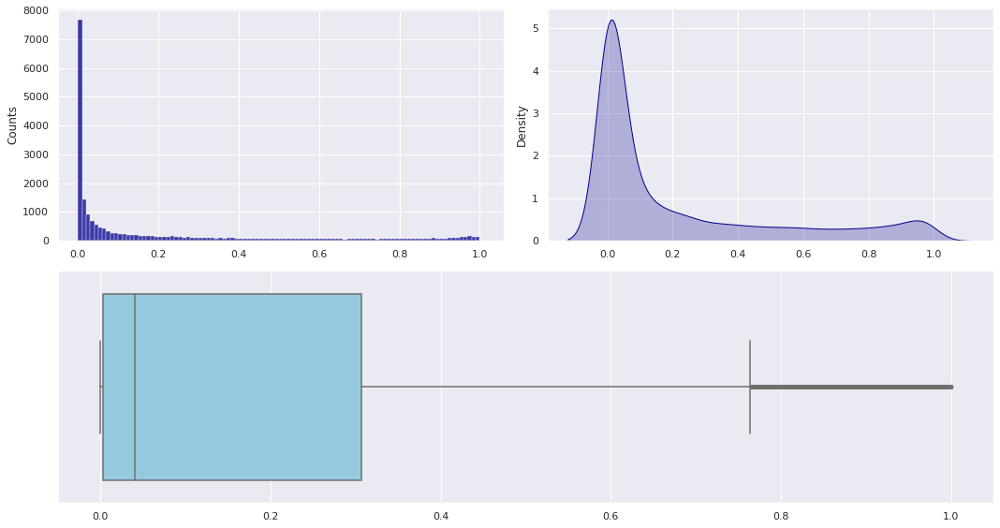

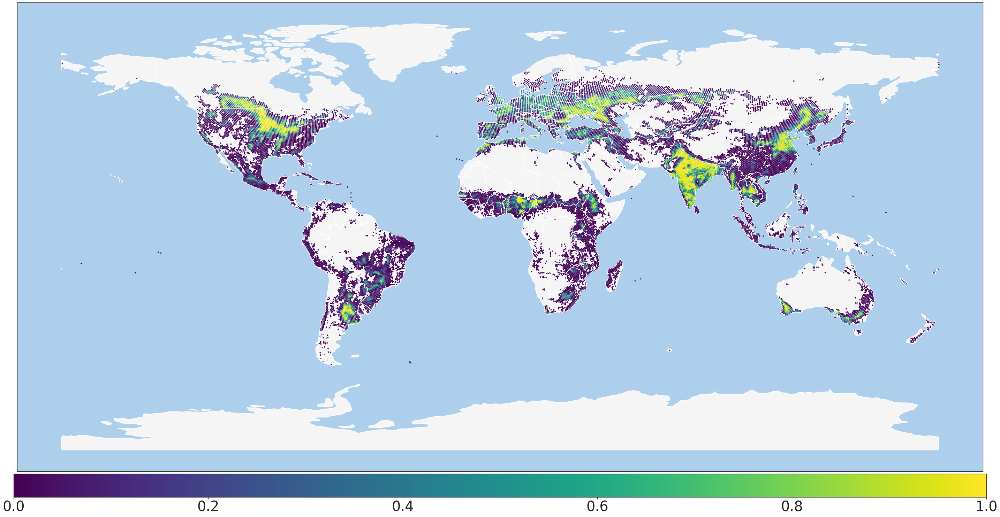

In [12]:
# Only strictly positive fractions
mask = LC[lc] > 0

display(Markdown("The sample unbiased skewness of the distribution is "
                 f"{LC[mask][lc].skew():.4}"))

name = f"IGBP{lc_id}_EmpiricalDistribution_PositiveValues"
EmpiricalDistribution(LC[mask][lc], save=save_plot, plot_dir=plot_dir, 
                      title=name, save_params=SPP)

GeoPlot(LC[mask], lc, adjust_colorbar_params={'vmin':0}, save=save_plot,
        plot_dir=plot_dir, title=f'IGBP{lc_id}_Map_PositiveValues',
        save_params=SPP)

# Transformations

## Log-transformed fractions

In order to apply the $\log$-transformation we need to get rid of zero fractions, then we apply the transformation $log(x+\varepsilon)$, with $\varepsilon >0$ constant.

The sample unbiased skewness of the $\log$-transformed distribution is 0.9174

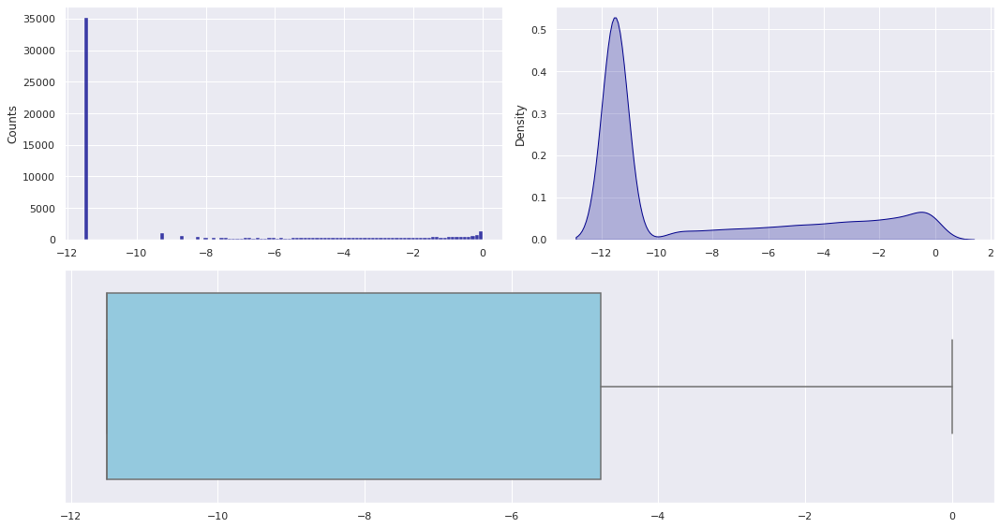

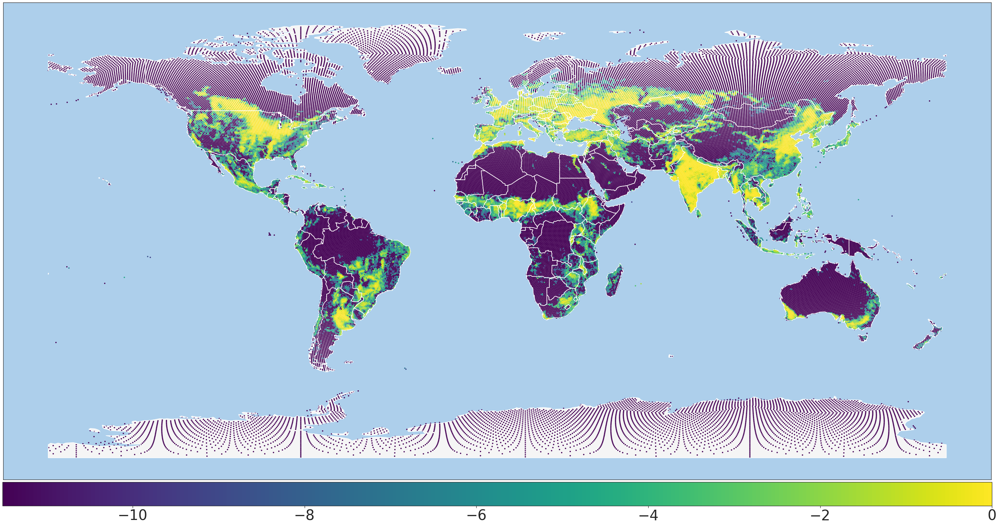

In [13]:
# Log-tranformation
LC[f"log_{lc}"] = LC[lc].map(lambda x : np.log(x+eps))

display(Markdown(r"The sample unbiased skewness of the $\log$-transformed "
                 f"distribution is {LC[f'log_{lc}'].skew():.4}"))

name = f"IGBP{lc_id}_EmpiricalDistribution_LogTransformedValues"
EmpiricalDistribution(LC[f"log_{lc}"], save=save_plot, plot_dir=plot_dir, 
                      title=name, save_params=SPP)

GeoPlot(LC, f"log_{lc}", save=save_plot, plot_dir=plot_dir,
        title=f'IGBP{lc_id}_Map_LogTransformedValues', save_params=SPP)

## Box&Cox-transformed fractions

In order to apply the Box&Cox-transformation we need to get rid of zero fractions, then we apply the same trick  with a constant $\varepsilon >0$ used for the $\log$-transformation.

The sample unbiased skewness of the Box&Cox-transformed distribution is 0.6275

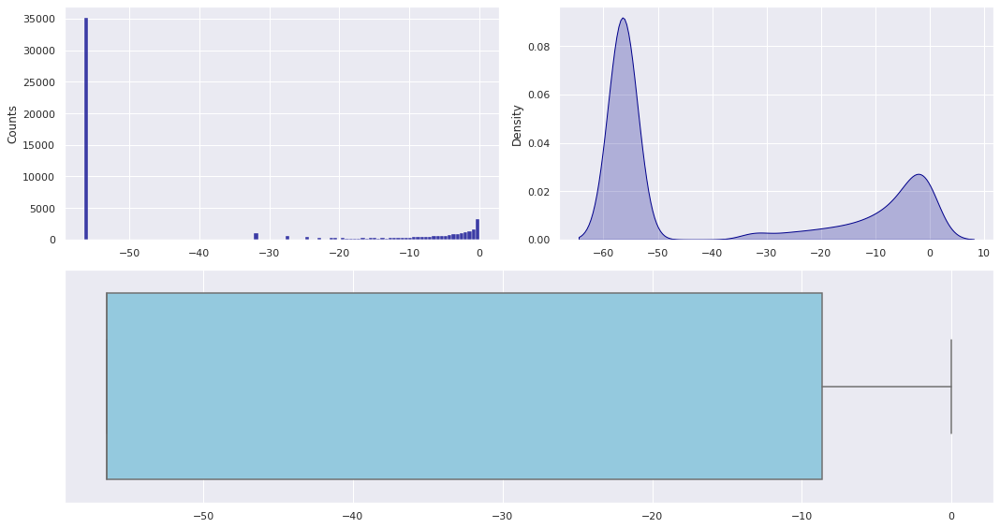

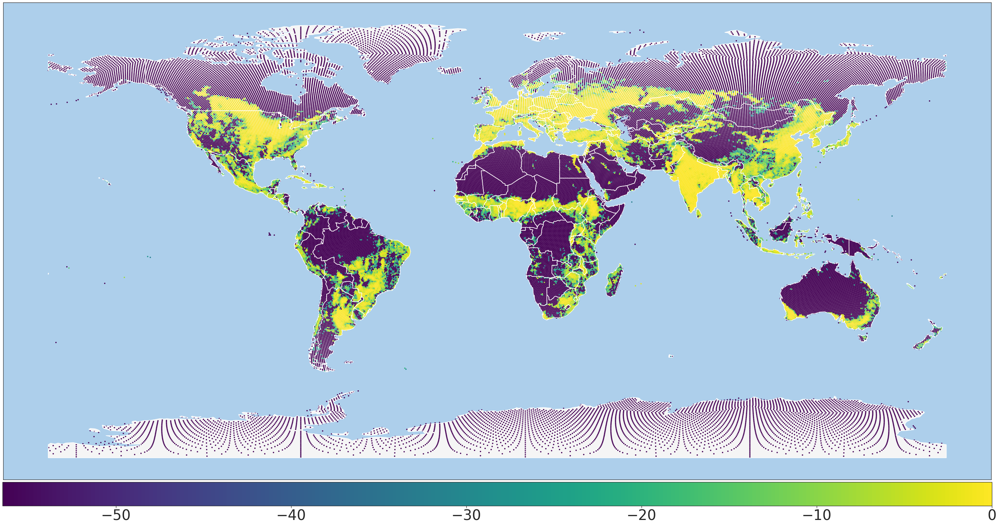

In [14]:
# Box&Cox-tranform
LC[f"BC_{lc}"] = boxcox(LC[lc]+eps)[0]

display(Markdown(r"The sample unbiased skewness of the Box&Cox-transformed "
                 f"distribution is {LC[f'BC_{lc}'].skew():.4}"))

name = f"IGBP{lc_id}_EmpiricalDistribution_Box&CoxTransformedValues"
EmpiricalDistribution(LC[f"BC_{lc}"], save=save_plot, plot_dir=plot_dir,
                      title=name, save_params=SPP)

GeoPlot(LC, f"BC_{lc}", save=save_plot, plot_dir=plot_dir,
        title=f'IGBP{lc_id}_Map_Box&CoxTransformedValues', save_params=SPP)

# Correlation with features

## Spearman correlation coefficient

Notice that, since the Spearman coefficient is invariant under monotonic transformation of variables, then we do not need to recompute it for the transformed target variables.

In [15]:
# Compute the Spearman coefficient between the target and each feature
cols = [f'IGBP_{lc_id}_Fraction'] + bv_cols
Spear_corr = data[cols].corr(method='spearman')
Spear_corr = Spear_corr[f'IGBP_{lc_id}_Fraction'][bv_cols].copy()

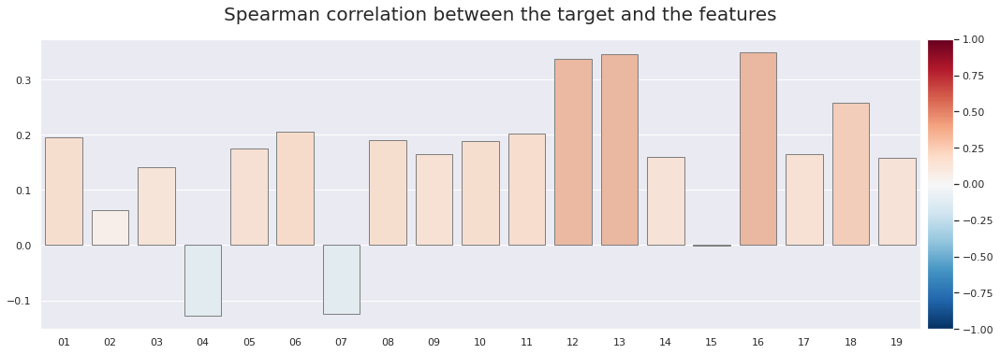

In [16]:
norm = TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
cmap = plt.get_cmap("RdBu_r")

fig, ax = plt.subplots(figsize=(15, 5))

divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="3%", pad=0.1)

sns.barplot(x=bv_ids, y=Spear_corr.values, ax=ax, edgecolor='gray',
            palette=cmap(norm(Spear_corr.values)))
plt.colorbar(ScalarMappable(cmap=cmap, norm=norm), cax=cax)

fig.tight_layout()

if save_plot:
    name = f"IGBP{lc_id}_SpearmanCorrelationWithFeatures"
    plt.savefig(os.path.join(plot_dir, f"{name}.{SPP['format']}"), **SPP)

fig.suptitle("Spearman correlation between the target and the features", 
             y=1.05, size=20)
plt.show()

## Pearson correlation coefficient

In [17]:
# Compute the Pearson coefficient between the target and each feature
# Not-transformed target
cols = [f'IGBP_{lc_id}_Fraction'] + bv_cols
Pears_corr = data[cols].corr(method='pearson')
Pears_corr = Pears_corr[f'IGBP_{lc_id}_Fraction'][bv_cols].copy()

# Log-transformed target
data[f'log_IGBP_{lc_id}_Fraction'] = LC[f'log_{lc}'].copy()
cols[0] = f'log_IGBP_{lc_id}_Fraction'
Pears_corr_log = data[cols].corr(method='pearson')
Pears_corr_log = Pears_corr_log[f'log_IGBP_{lc_id}_Fraction'][bv_cols].copy()

# Box&Cox-transformed target
data[f'BC_IGBP_{lc_id}_Fraction'] = LC[f'BC_{lc}'].copy()
cols[0] = f'BC_IGBP_{lc_id}_Fraction'
Pears_corr_BC = data[cols].corr(method='pearson')
Pears_corr_BC = Pears_corr_BC[f'BC_IGBP_{lc_id}_Fraction'][bv_cols].copy()

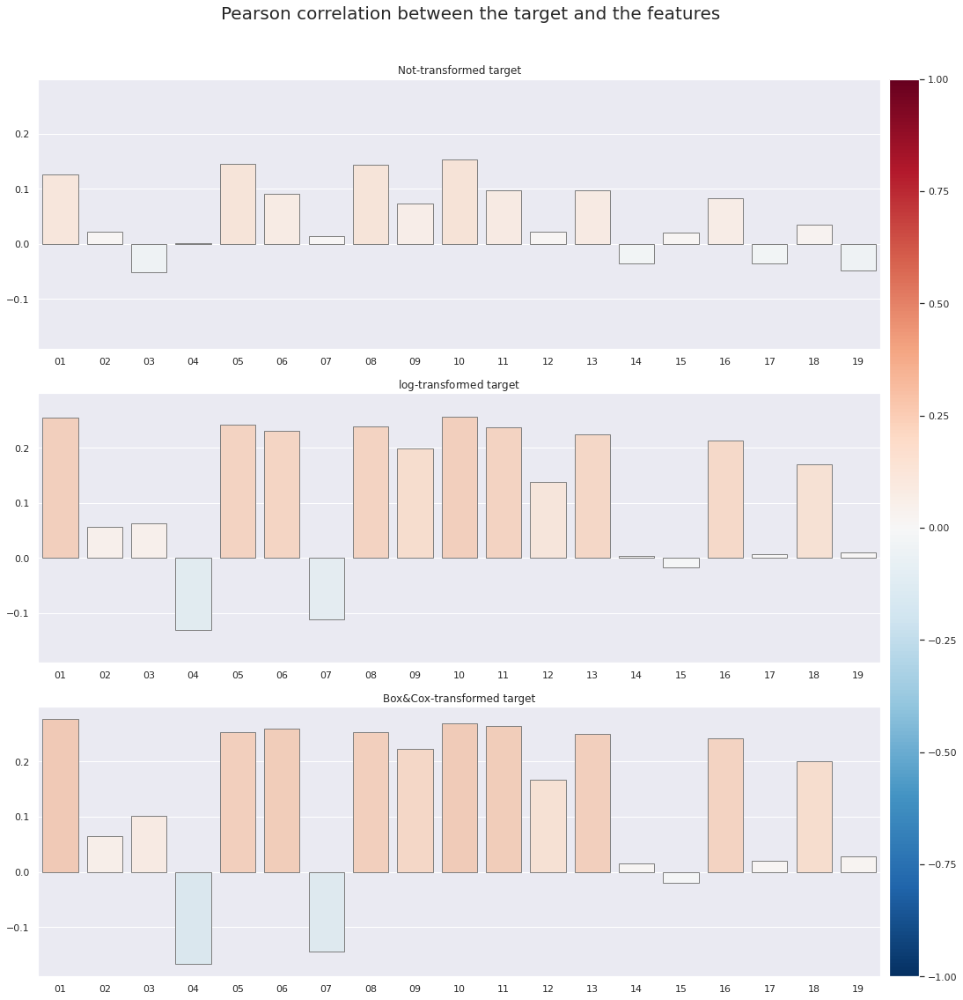

In [18]:
norm = TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
cmap = plt.get_cmap("RdBu_r")

fig, ax = plt.subplots(nrows=3, figsize=(15, 15), sharey=True)

sns.barplot(x=bv_ids, y=Pears_corr.values, ax=ax[0], edgecolor='gray',
            palette=cmap(norm(Pears_corr.values)))
ax[0].set_title('Not-transformed target')

sns.barplot(x=bv_ids, y=Pears_corr_log.values, ax=ax[1], edgecolor='gray',
            palette=cmap(norm(Pears_corr_log.values)))
ax[1].set_title(f'$\log$-transformed target')

sns.barplot(x=bv_ids, y=Pears_corr_BC.values, ax=ax[2], edgecolor='gray',
            palette=cmap(norm(Pears_corr_BC.values)))
ax[2].set_title('Box&Cox-transformed target')

fig.tight_layout()

plt.colorbar(ScalarMappable(cmap=cmap, norm=norm), pad=0.01, ax=ax,
             location='right', fraction=0.05, aspect=30)

if save_plot:
    name = f"IGBP{lc_id}_PearsonCorrelationWithFeatures"
    plt.savefig(os.path.join(plot_dir, f"{name}.{SPP['format']}"), **SPP)

fig.suptitle("Pearson correlation between the target and the features",
             y=1.05, size=20)
plt.show()

# Pairwise relationships

## No transformation of target variable

### Scatterplots

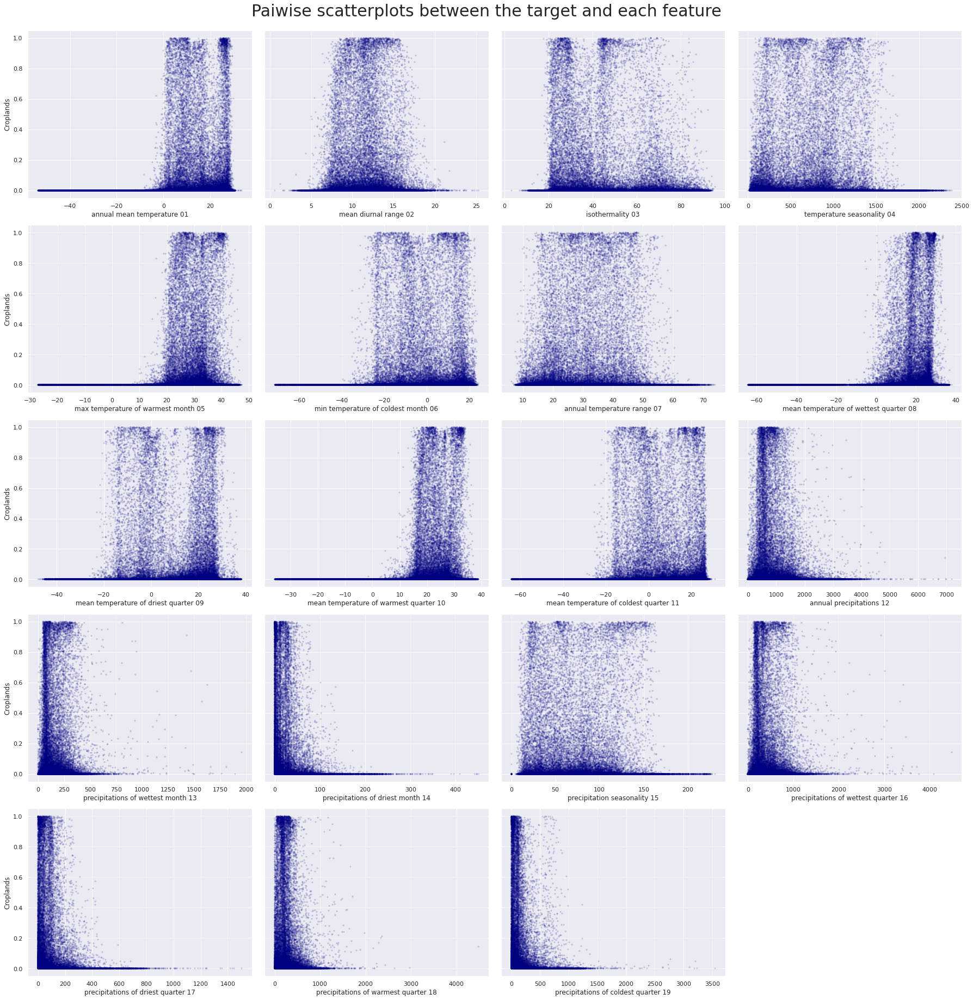

In [19]:
fig, axs = plt.subplots(nrows=5, ncols=4, figsize=(25, 25), sharey=True)

for bv_id, bv_label, ax in zip(bv_ids, bv_labels, axs.flat):
    sns.scatterplot(data=data, x=f'BIO{bv_id}_Centroid', y=f'IGBP_{lc_id}_Fraction',
                    marker='+', s=10, color='navy', ax=ax, alpha=0.7)
    ax.set_xlabel(bv_label)
    if ax.is_first_col():
        ax.set_ylabel(lc)
    else:
        ax.set_ylabel('')
fig.delaxes(axs.flat[-1])

fig.tight_layout()

if save_plot:
    name = f"IGBP{lc_id}_ScatterplotTargetVsFeatures"
    plt.savefig(os.path.join(plot_dir, f"{name}.{SPP['format']}"), **SPP)

fig.suptitle("Paiwise scatterplots between the target and each feature",
             y=1.02, size=30)

plt.show()

### Log-rescaled 2D Histograms

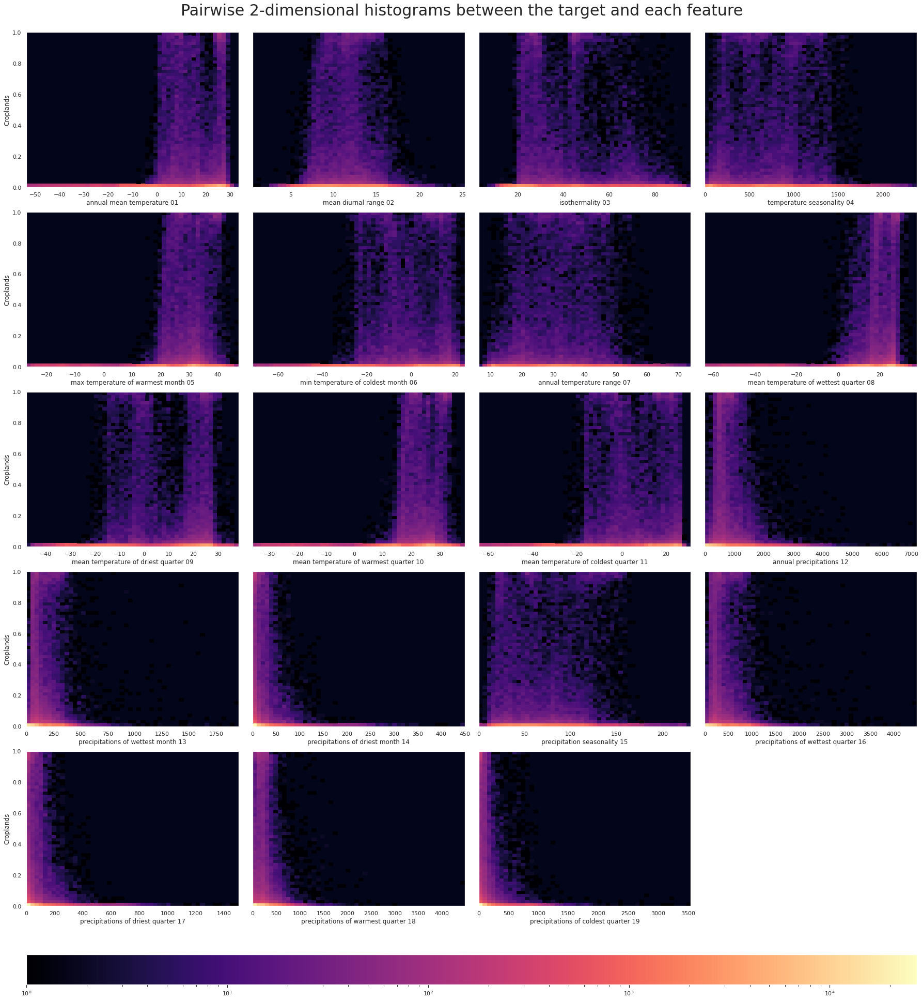

In [20]:
fig, axs = plt.subplots(nrows=5, ncols=4, figsize=(25, 27), sharey=True)

# Find the max of all counts in every 2D-histogram to set the log-scale of colorbar.
counts = []
for bv_id, ax in zip(bv_ids, axs.flat):
    h = ax.hist2d(x=data[f'BIO{bv_id}_Centroid'], y=data[f'IGBP_{lc_id}_Fraction'],
                  bins=50)
    counts.append(h[0])
vmax = max(np.max(h) for h in counts)

# Log-rescale counts
norm = LogNorm(vmin=1, vmax=vmax)
# Plot 2D-histograms
for bv_id, bv_label, ax in zip(bv_ids, bv_labels, axs.flat):
    ax.hist2d(x=data[f'BIO{bv_id}_Centroid'], y=data[f'IGBP_{lc_id}_Fraction'],
              bins=50, cmap='magma', norm=norm)
    ax.set_xlabel(bv_label)
    if ax.is_first_col():
        ax.set_ylabel(lc)
    else:
        ax.set_ylabel('')

fig.delaxes(axs.flat[-1])

fig.tight_layout()

plt.colorbar(ScalarMappable(cmap='magma', norm=norm), pad=0.05, ax=axs, 
             location='bottom', fraction=0.05, aspect=30)

if save_plot:
    name = f"IGBP{lc_id}_2DHistogramTargetVsFeatures"
    plt.savefig(os.path.join(plot_dir, f"{name}.{SPP['format']}"), **SPP)

fig.suptitle("Pairwise 2-dimensional histograms between the target and each feature",
             y=1.02, size=30)

plt.show()